## Installation
#### You can install the grad_routing package in one of the following ways:

#### 1. Install from PyPI (recommended)

In [ ]:
!pip install grad_routing

#### 2. Install from wheel file (Windows users)

In [ ]:
!pip install ../grad_routing-0.1.0-cp310-cp310-win_amd64.whl


#### 3. Install from wheel file (Linux users)

In [ ]:
!pip install ../grad_routing-0.1.0-cp312-cp312-linux_x86_64.whl

In [1]:
# import the installed package
import grad_routing as gr


In [2]:
print(gr.about()) # print Package description


Package      : grad_routing
Author       : Dinesh Joshi
Email        : joshidinesh0227@gmail.com
Version      : 0.1.0
License      : Licensed under the Apache License 2.0.
Copyright    : © 2025 Dinesh Joshi

Description:
    High-performance, XLA-optimized, Cython-accelerated routing utilities for acyclic flow networks. Supports PCRaster-style LDD grids with codes 1–9 (1–4,6–9 for directional flow; 5 for no-flow / outlet).

Keywords:
    routing, flow accumulation, differentiable modeling, XLA, Cython, PCRaster, LDD, acyclic networks, environmental modeling

Usage Notes:
    • Suitable for any acyclic flow network
    • XLA-optimized and GPU-compatible
    • Supports PCRaster-style LDD with:
        - Codes 1–4, 6–9: directional flow to neighbor
        - Code 5       : outlet / no-flow / sink cell
    • Designed for research, ML hydrology, DAG simulations, and environmental modeling




In [3]:
import numpy as np

path_ldd=r"Sample_Inputs/ldd.npy"
ldd=np.load(path_ldd)

nrow,ncol= ldd.shape

#### 4. Key Package Functions for Differentiable Routing

In [4]:
tiers, upstream_tiers, downstream_tiers = gr.topological_tiers(ldd) # create topological ustream and downstream tiers 

Generated 645 topological tiers.
Suggested chunk sizes for XLA preparation: [10, 100, 1000, 10000]
  → Choose optimum chunk size for speed and memory


In [5]:
upstream = gr.xla_optimize_tiers(upstream_tiers, chunk_size=1000) # chunk upstream tiers for XLA optimization
downstream = gr.xla_optimize_tiers(downstream_tiers, chunk_size=1000) # chunk downstream tiers for XLA optimization

Generated 731 topological chunked tiers.
Generated 731 topological chunked tiers.


In [6]:
accuflux= gr.differentiable_accuflux

In [7]:
import tensorflow as tf
tiers_down_tf = tf.convert_to_tensor(downstream, dtype=tf.int32)
tiers_up_tf   = tf.convert_to_tensor(upstream, dtype=tf.int32)

#### 5. Example Hydrological Model for Implementing Differentiable Routing

In [8]:
import model

In [9]:
# Define start and end date
start_date = "2004-01-01"
end_date   = "2007-12-31" 
timestep_array = model.month_idx(start_date, end_date)

In [10]:
trainable_params=model.trainable_params

#### 6. Demonstrating Differentiability

##### Fast version (XLA):

In [11]:
train_step= tf.function(model.train_step, jit_compile=True)

##### Normal version

In [12]:
#train_step= model.train_step

In [13]:
!pip install openpyxl

In [13]:
import tensorflow as tf
import numpy as np
import pandas as pd

# -------------------------------------------------------
# Helper: Load daily input grid safely
# -------------------------------------------------------
def load_grid(path):
    arr = np.load(path)
    arr = np.nan_to_num(arr, nan=0.0)
    return tf.convert_to_tensor(arr, dtype=tf.float32)

# -------------------------------------------------------
# Load fixed inputs
# -------------------------------------------------------
discharge_np = pd.read_excel("Sample_Inputs/discharge.xlsx")["Observed"].to_numpy()
discharge_tf = tf.constant(discharge_np, dtype=tf.float32)

lulc = np.nan_to_num(np.load("Sample_Inputs/lulc.npy"), nan=0.0)
lulc_tf = tf.constant(lulc, dtype=tf.float32)

days_per_month = [0,31,60,91,121,152,182,213,244,274,305,335,366]

optimizer = tf.keras.optimizers.Adam(learning_rate=0.1)

# -------------------------------------------------------
# Clean training loop
# -------------------------------------------------------
NUM_EPOCHS = 10

for epoch in range(NUM_EPOCHS):

    state = model.initial_state(nrow, ncol)

    Q_simulation = []
    Q_observed   = []
    batch_losses = []

    print(f"\n===== EPOCH {epoch+1} =====")

    # Loop over 12 months
    for month_idx_0 in range(len(days_per_month) - 1):

        start, end = days_per_month[month_idx_0], days_per_month[month_idx_0+1]
        num_days = end - start

        # Initialize gradient accumulator for this month
        cumulative_gradient = [tf.zeros_like(p) for p in trainable_params]

        # Loop over all daily timesteps in the month
        for day in range(start, end):

            # Month index for parameter lookup
            month_idx = timestep_array[day][1] - 1

            # Load inputs for the day
            Tmax_t = load_grid(f"Sample_Inputs/Tmax/Tmax{day}.npy")
            Tmin_t = load_grid(f"Sample_Inputs/Tmin/Tmin{day}.npy")
            Prec_t = load_grid(f"Sample_Inputs/Prec/Prec{day}.npy")
            Pet_t  = load_grid(f"Sample_Inputs/PET/PET{day}.npy")

            Qobs = discharge_tf[day]

            # ---- Single training step ----
            loss, Qsim_out, state, grads = train_step(
                Tmax_t, Tmin_t, Prec_t, Pet_t, Qobs,
                state, trainable_params,
                lulc_tf, accuflux, tiers_down_tf, tiers_up_tf,
                month_idx
            )

            # Save tracking
            Q_simulation.append(Qsim_out.numpy())
            Q_observed.append(Qobs.numpy())
            batch_losses.append(loss.numpy())

            # Accumulate gradients for this month
            cumulative_gradient = [
                cg + (g if g is not None else tf.zeros_like(cg))
                for cg, g in zip(cumulative_gradient, grads)
            ]

        # Apply averaged gradients for the month
        avg_grad = [cg / num_days for cg in cumulative_gradient]
        optimizer.apply_gradients(zip(avg_grad, trainable_params))

        print(f"Month {month_idx_0+1} completed")

    # ---- Monthly performance summary ----
    Qsim_np = np.array(Q_simulation)
    Qobs_np = np.array(Q_observed)

    NSE = 1 - np.sum((Qsim_np - Qobs_np)**2) / np.sum((Qobs_np - Qobs_np.mean())**2)

    print(f"EPOCH {epoch+1}: NSE = {NSE:.4f}, Avg Loss = {np.mean(batch_losses):.6f}")



===== EPOCH 1 =====
Month 1 completed
Month 2 completed
Month 3 completed
Month 4 completed
Month 5 completed
Month 6 completed
Month 7 completed
Month 8 completed
Month 9 completed
Month 10 completed
Month 11 completed
Month 12 completed
EPOCH 1: NSE = 0.7050, Avg Loss = 7.028931

===== EPOCH 2 =====
Month 1 completed
Month 2 completed
Month 3 completed
Month 4 completed
Month 5 completed
Month 6 completed
Month 7 completed
Month 8 completed
Month 9 completed
Month 10 completed
Month 11 completed
Month 12 completed
EPOCH 2: NSE = 0.7707, Avg Loss = 5.065800

===== EPOCH 3 =====
Month 1 completed
Month 2 completed
Month 3 completed
Month 4 completed
Month 5 completed
Month 6 completed
Month 7 completed
Month 8 completed
Month 9 completed
Month 10 completed
Month 11 completed
Month 12 completed
EPOCH 3: NSE = 0.8104, Avg Loss = 4.083522

===== EPOCH 4 =====
Month 1 completed
Month 2 completed
Month 3 completed
Month 4 completed
Month 5 completed
Month 6 completed
Month 7 completed
Mont

In [14]:
# Load basin mask: 1 for valid cells, 0 for outside
mask = np.load(r"Sample_Inputs/mask.npy")

#### 7. Extracting Model Parameters and Visualizing Spatial Parameters

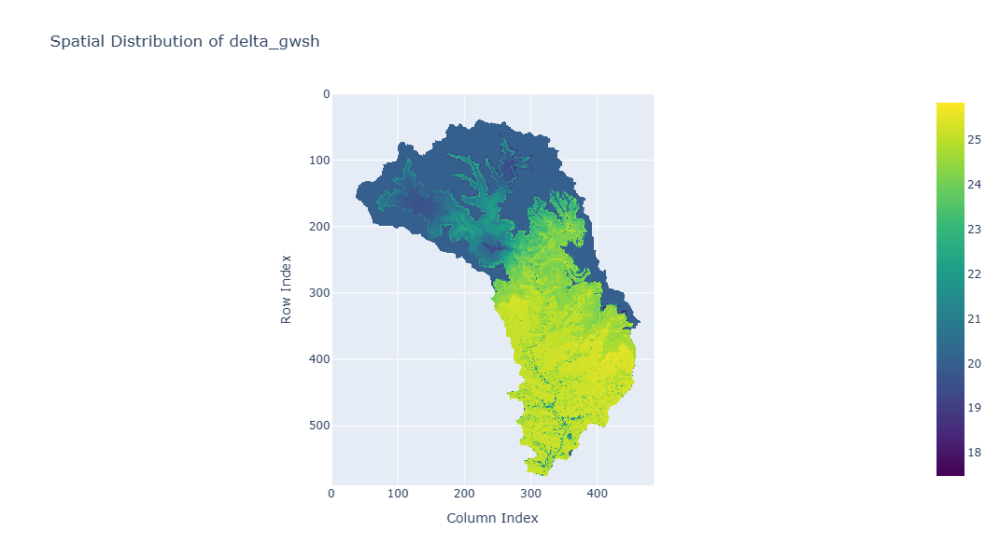

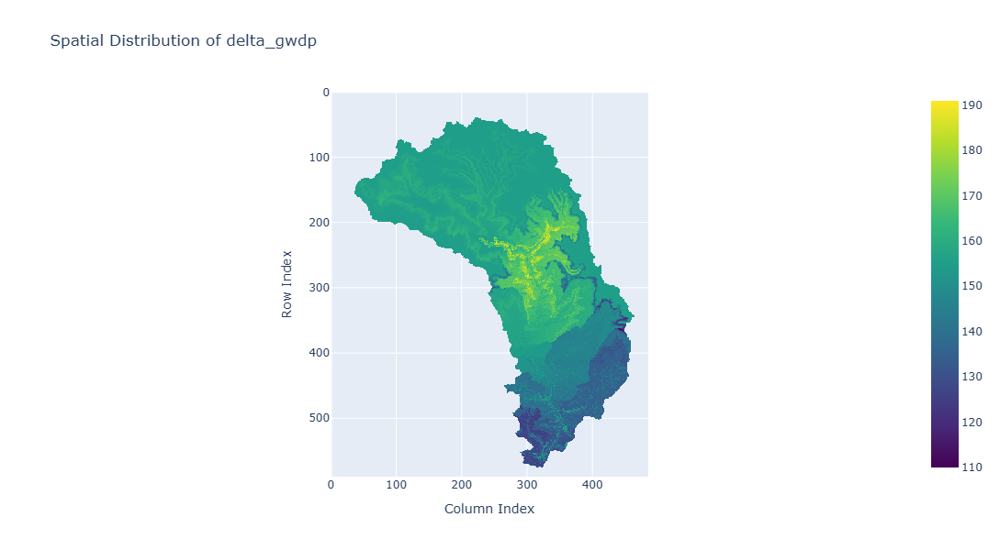

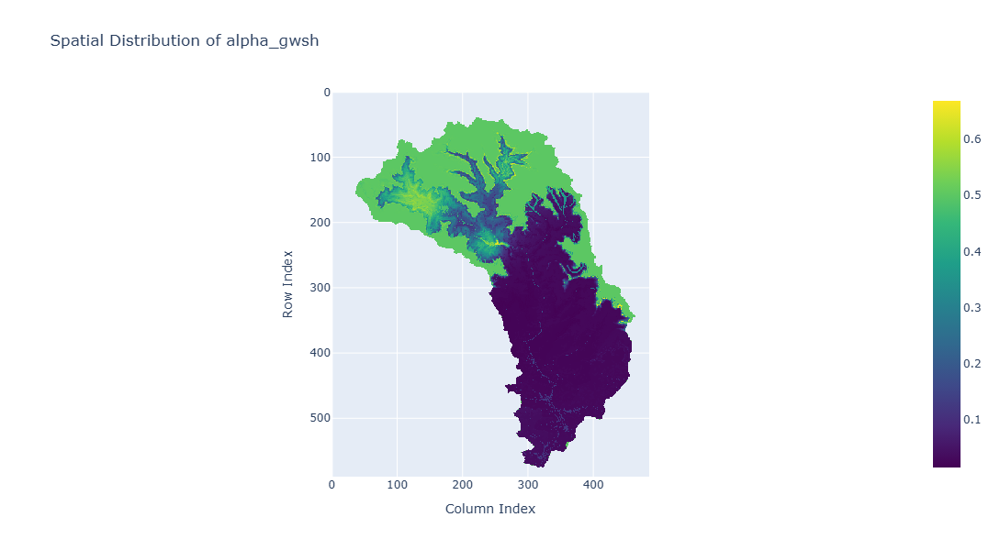

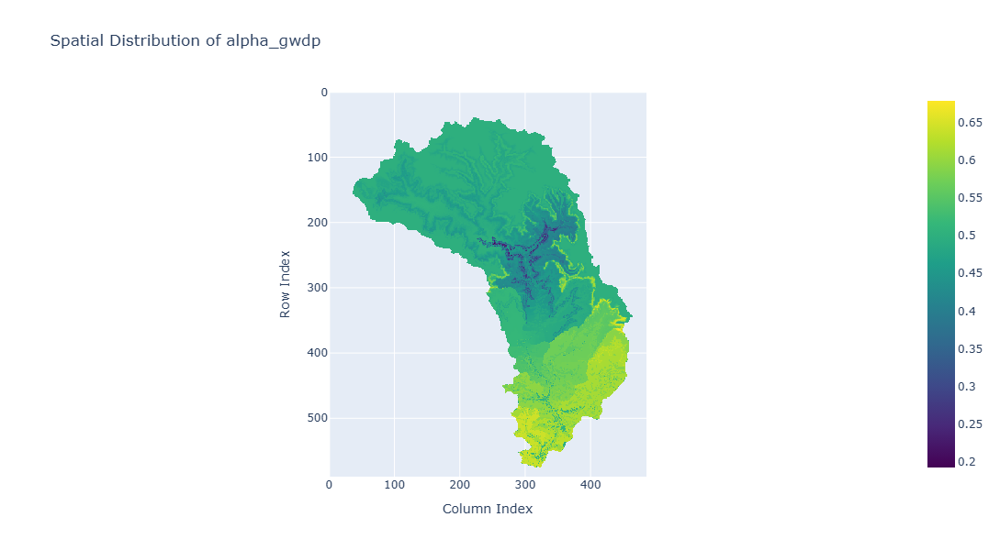

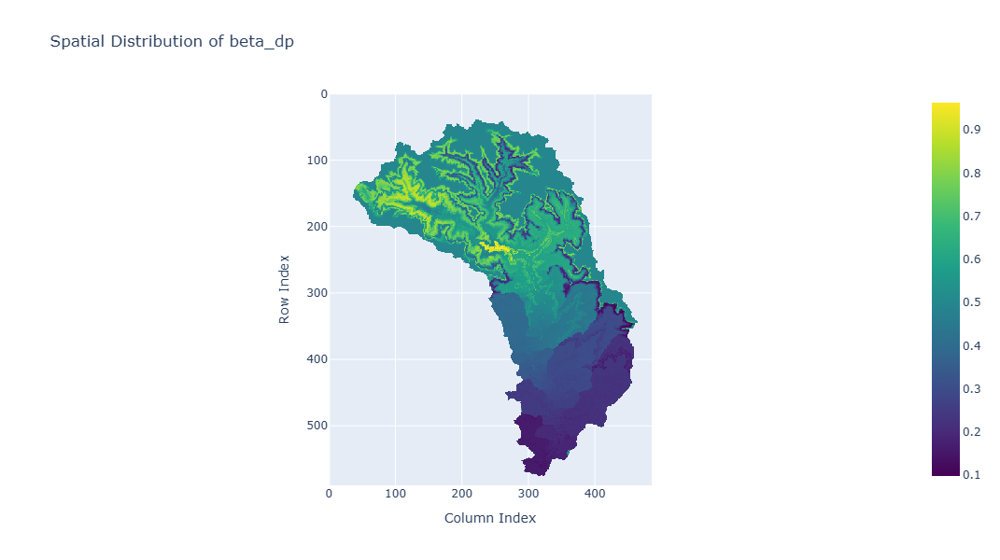

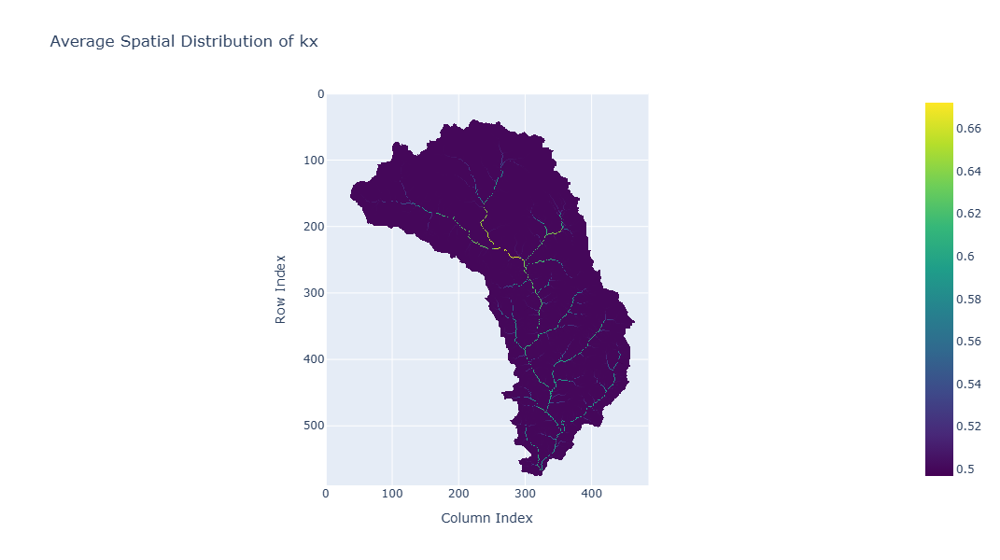

In [15]:
extracted = model.extract_spatial_parameters(trainable_params, lulc_tf)
model.plot_spatial_parameters(extracted, mask)